<a href="https://colab.research.google.com/github/EMockevicius/deep-learning/blob/main/deep_dreaming.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Experimentation with Deep Dreaming using VGG models

One of the approaches of visualizing what trained network have learned on various layers.

Main idea is to supply some initial image, then emphasize values of network responses (by multiplying them by themselves - raising to power 2) in one or more layers and change the initial image so that it causes the same emphasized responses.

In [ ]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '-1' #'-1'  # '-1' is CPU, '0' - 1st GPU, '1' - 2nd GPU..."

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.applications import vgg16

from tensorflow.keras.applications import vgg19

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd '/content/drive/MyDrive/Colab Notebooks/deep_learning/deep_dreaming'
%ls

We will use vgg16 and vgg19 model trained on imagenet.

In [ ]:
# Try experimenting with a more interesting models
#model = vgg16.VGG16(weights="imagenet", include_top=False)
model = vgg19.VGG19(weights="imagenet", include_top=False)
model.summary()

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0     

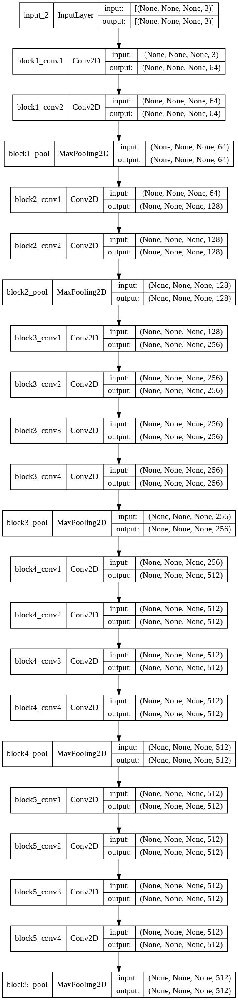

In [ ]:
keras.utils.plot_model(model, to_file="model.jpg",
                       show_shapes=True,
                       show_layer_names=True,
                       rankdir="TB",
                       dpi=96)

We will take some layers from the middle of the model and emphasize their outputs. Add those layer names into `layer_settings` dictionary together with the coefficient of how much to emphasize the outputs when mixing outputs from few layers). The "deeper" the layer, the more time will be needed to "train" the network input.

In [ ]:
def preprocess_image(image_path):
    # Util function to open, resize and format pictures
    # into appropriate arrays.
    img = keras.preprocessing.image.load_img(image_path)
    img = keras.preprocessing.image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    # Preprocess image
    img = img / 127.5 - 1.0
    return img


def deprocess_image(x):
    # Util function to convert a NumPy array into a valid image.
    x = x.reshape((x.shape[1], x.shape[2], 3))
    # Undo image preprocessing
    x += 1.0
    x *= 127.5
    # Convert to uint8 and clip to the valid range [0, 255]
    x = np.clip(x, 0, 255).astype("uint8")
    return x

Now the loss including the emphasize coefficient should be defined for every layer we are interested in.

In [ ]:
def compute_loss(input_image):
    features = feature_extractor(input_image)
    # Initialize the loss
    loss = tf.zeros(shape=())
    for name in features.keys():
        coeff = layer_settings[name]
        activation = features[name]
        # We avoid border artifacts by only involving non-border pixels in the loss.
        scaling = tf.reduce_prod(tf.cast(tf.shape(activation), "float32"))
        # Pay attention - tf.square emphasizes big outputs (raise to power 2) that the main idea here
        loss += coeff * tf.reduce_sum(tf.square(activation[:, 2:-2, 2:-2, :])) / scaling
    return loss

Now we need to define the custom "train" step to modify the input only and leave the weights intact.

In [ ]:
@tf.function
def gradient_ascent_step(img, learning_rate):
    with tf.GradientTape() as tape:
        tape.watch(img)
        loss = compute_loss(img)
    # Compute gradients.
    grads = tape.gradient(loss, img)
    # Normalize gradients.
    grads /= tf.maximum(tf.reduce_mean(tf.abs(grads)), 1e-6)
    img += learning_rate * grads
    return loss, img


def gradient_ascent_loop(img, iterations, learning_rate, max_loss=None):
    for i in range(iterations):
        loss, img = gradient_ascent_step(img, learning_rate)
        if max_loss is not None and loss > max_loss:
            break
        print("... Loss value at step %d: %.2f" % (i, loss))
    return img

Let's load the initial image.

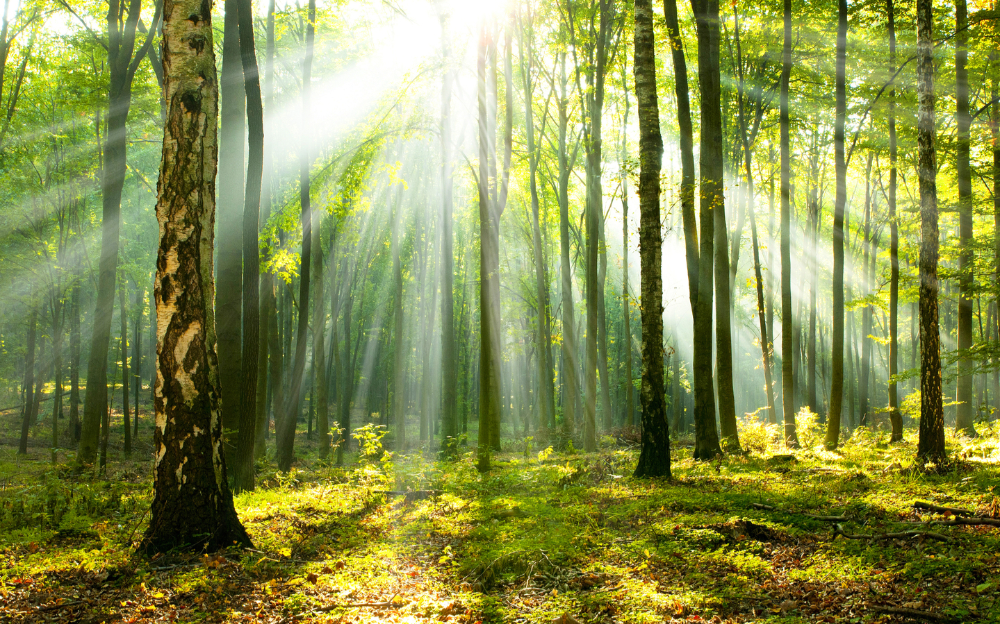

In [ ]:
#base_image_path = "sky.jpg"
#result_prefix = "sky_dream"

base_image_path = "forest.jpg"
result_prefix = "forest_dream"

#base_image_path = "biden.jpg"
#result_prefix = "biden_dream"

#base_image_path = "biden2.jpg"
#result_prefix = "biden2_dream"

#base_image_path = "obama_biden.jpg"
#result_prefix = "obama_biden_dream"

#base_image_path = "trump.jpg"
#result_prefix = "trump_dream"


# These are the names of the layers
# for which we try to maximize activation,
# as well as their weight in the final loss
# we try to maximize.
# You can tweak these setting to obtain new visual effects.
layer_settings = {
    #"block2_conv2": 2.0,
    #"block3_conv3": 1.0,
    #"block4_conv3": 2.0,
    "block5_conv3": 3.0,
}

# Playing with these hyperparameters will also allow you to achieve new effects

#pradinis
step = 0.03  # Gradient ascent step size (try increasing it!)
num_octave = 2  # Number of scales at which to run gradient ascent
octave_scale = 2.0  # Size ratio between scales
iterations = 10  # Number of ascent steps per scale
max_loss = 15.0

#antras
#step = 0.5  # Gradient ascent step size (try increasing it!)           ###
#num_octave = 2  # Number of scales at which to run gradient ascent
#octave_scale = 2.0  # Size ratio between scales
#iterations = 10  # Number of ascent steps per scale
#max_loss = 15.0

#trecias
#step = 0.03  # Gradient ascent step size (try increasing it!)
#num_octave = 3  # Number of scales at which to run gradient ascent   ###
#octave_scale = 2.0  # Size ratio between scales
#iterations = 10  # Number of ascent steps per scale
#max_loss = 15.0

#ketvirtas
#step = 0.03  # Gradient ascent step size (try increasing it!)
#num_octave = 2  # Number of scales at which to run gradient ascent
#octave_scale = 4.0  # Size ratio between scales                       ###
#iterations = 10  # Number of ascent steps per scale
#max_loss = 15.0

#penktas
#step = 0.03  # Gradient ascent step size (try increasing it!)
#num_octave = 2  # Number of scales at which to run gradient ascent
#octave_scale = 2.0  # Size ratio between scales
#iterations = 15  # Number of ascent steps per scale                  ###
#max_loss = 15.0

#sestas
#step = 0.03  # Gradient ascent step size (try increasing it!)
#num_octave = 2  # Number of scales at which to run gradient ascent
#octave_scale = 2.0  # Size ratio between scales
#iterations = 15  # Number of ascent steps per scale                  
#max_loss = 25.0                                                      ###

#paskutinis
#step = 0.04  # Gradient ascent step size (try increasing it!)        ###
#num_octave = 3  # Number of scales at which to run gradient ascent ###
#octave_scale = 2.5  # Size ratio between scales                      ###
#iterations = 20  # Number of ascent steps per scale                  ###
#max_loss = 20.0                                                      ###

from IPython.display import Image, display

display(Image(base_image_path))

Outputs should be defined for every layer we want to emphasize the outputs for. The more layers are mentioned in `layer_settings` dict, the more outputs the model will have.

Before supplying the image to the model we need to convert it to array, reshape and normalize the inputs to [-1;1] range.

Also we need to define an inverse operation: reshaping and scaling to [0;255], to visualize the output image.

In [ ]:
# Get the symbolic outputs of each "key" layer (we gave them unique names).
outputs_dict = dict(
    [
        (layer.name, layer.output)
        for layer in [model.get_layer(name) for name in layer_settings.keys()]
    ]
)

print(outputs_dict)

# Set up a model that returns the activation values for every target layer
# (as a dict)
feature_extractor = keras.Model(inputs=model.inputs, outputs=outputs_dict)

{'block5_conv3': <KerasTensor: shape=(None, None, None, 512) dtype=float32 (created by layer 'block5_conv3')>}


Here starts the "training" process.

In [ ]:
original_img = preprocess_image(base_image_path)
original_shape = original_img.shape[1:3]

successive_shapes = [original_shape]
for i in range(1, num_octave):
    shape = tuple([int(dim / (octave_scale ** i)) for dim in original_shape])
    successive_shapes.append(shape)
successive_shapes = successive_shapes[::-1]
shrunk_original_img = tf.image.resize(original_img, successive_shapes[0])

img = tf.identity(original_img)  # Make a copy
for i, shape in enumerate(successive_shapes):
    print("Processing octave %d with shape %s" % (i, shape))
    img = tf.image.resize(img, shape)
    img = gradient_ascent_loop(
        img, iterations=iterations, learning_rate=step, max_loss=max_loss
    )
    upscaled_shrunk_original_img = tf.image.resize(shrunk_original_img, shape)
    same_size_original = tf.image.resize(original_img, shape)
    lost_detail = same_size_original - upscaled_shrunk_original_img

    img += lost_detail #* 0.5
    shrunk_original_img = tf.image.resize(original_img, shape)

    keras.preprocessing.image.save_img(result_prefix + ".png", deprocess_image(img.numpy()))

Processing octave 0 with shape (449, 719)
... Loss value at step 0: 0.45
... Loss value at step 1: 0.99
... Loss value at step 2: 2.00
... Loss value at step 3: 3.51
... Loss value at step 4: 5.31
... Loss value at step 5: 7.62
... Loss value at step 6: 10.49
... Loss value at step 7: 13.47
Processing octave 1 with shape (899, 1439)
... Loss value at step 0: 2.42
... Loss value at step 1: 5.19
... Loss value at step 2: 8.64
... Loss value at step 3: 12.63


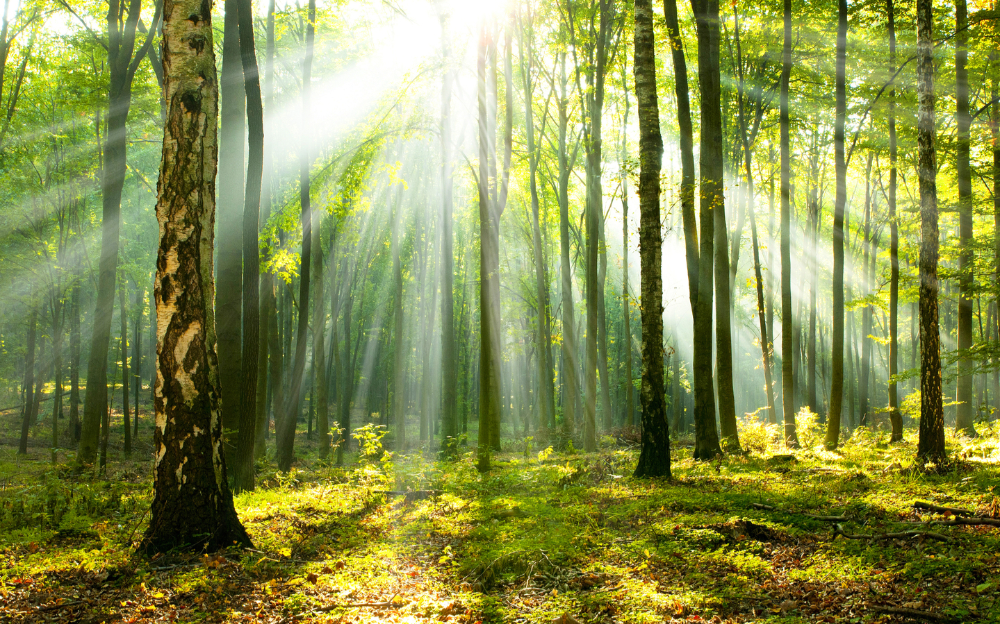

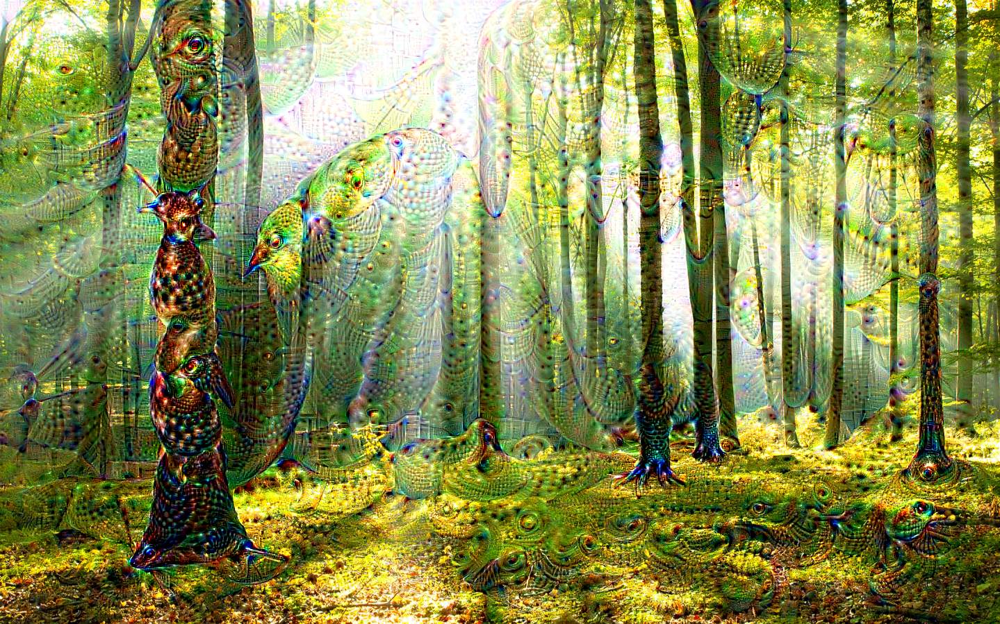

In [ ]:
display(Image(base_image_path))
display(Image(result_prefix + ".png"))